# Computational Partial Differential Equations

# Irene S. Nelson, PhD

## Day 1: Background and Fluid Dynamics

### Introduction: Partial Differential Equations

In research, when considering some quantity, we often find that how that quantity changes is just as, if not more interesting than the value. To that end, we often find ourselves looking at the instantaneous rate of change in a variable (called the *derivative*, found through a process called *differentiation*) alongside the value of that variable itself. An example of this concept that can often be seen in day-to-day life is the odometer and spedometer in your car. The car's odometer measures the total distance that the car has travelled, but moment-to-moment, it's much more important the car's speed as shown by the spedometer. By definition, speed is the *first derivative* of distance. We can also differentiate speed again to find the *second derivative*, our car's acceleration. 

Another common way to think of the derivative is as the slope of a curve at a point. We illustrate this below with a simple parabola shown with its tangent line at the point $x=1$

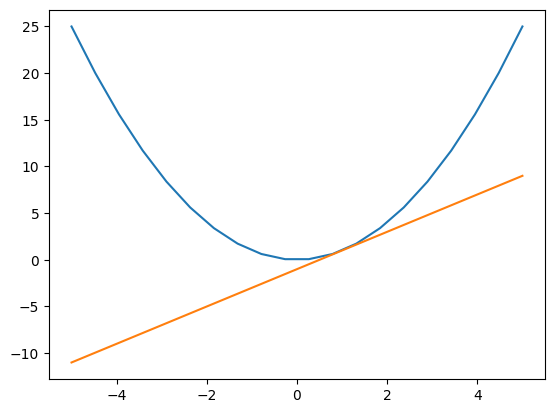

In [1]:
import numpy as np
import matplotlib.pyplot as plt

x            = np.linspace(-5,5,20)
y            = x*x
tangent_line = 2*x-1

plt.figure()
plt.plot(x,y)
plt.plot(x,tangent_line)
plt.show()

As such, a differential equation is just any equation that involves a variable and the derivatives of that variable. These equations have numerous and important applications in diverse fields ranging from finance (compound interest) to ecology (population growth) and physics. 

In physics, differential equations pop up in everything from quantum mechanics and thermodynamics to electromagnetism and general relativity. In these sessions, we will be focusing on three particular sets of equations:
1. The Navier-Stokes equations of thermodynamics
2. Maxwell's equations of electromagnetism
3. Einstein's equations of general relativity

As powerful as these equations are, they are also very complicated. It has been proven that general solutions to these equations simply do not exist, and the only exact solutions to these equations are limited to only the most simple cases that are extremely unlikely to occur in reality. For example, an exact solution to the equations of thermodynamics might be a completely sealed, completely still volume of air with constant temperature and pressure through the container. While these exact solutions do have their applications, most systems of interest are much, *much* more complicated. If you want to model a thermodynamic system such as Earth's atmosphere to predict weather, we must find approximate solutions.

### Approximate Solutions

The variables in a differential equation take on numbers that are continuous.  When we way that a variable is continuous, we mean that for any two points in time, no matter how close they are, there are more points in between them. However, a computer cannot work that way. A computer would need to be infinitely large in order to record the pressure at each of infinitely many points in space. This applies to time as well. As such, we will need to quantize our domain, that is, break it down into small pieces, as if they were building blocks. 

To do this in space, we will subdivide our domain of interest into a grid of cells. In each of these cells, we will sample each of the quantities we care about (this often includes derivatives as well). That is, we will consider the value of a variable throughout a grid cell to be the what we measure at a single point (typically the center) of that cell. We will do a similar process in time as well, only considering the value of these quantities at discrete points in time, which we call *timesteps*. 

So, approximating a differential equation will involve taking a starting value for the variable of interest and estimating the change in that variable over the course of one timestep. This must then be done for every grid cell in domain. Consider  compound interest, for example. The balance of a bank account at the beginning of the next month will be equal the balance at the beginning of the current month, plus interest. While we can solve this simple equation exactly for continuously compounding interest, banks will instead calculate it monthly. That is, once a month, they will take the balance, multiply it by the interest rate, and then add that much money to the balance.

With these approximations made, we are ready to begin simulating our system of choice. We can sort the differential equations that govern our system into two categories: constraint equations and evolution equations. Constraint equations tell us how our variables should behave at a single point in time; they can be used to generate initial data and to help verify that our approximations at later times are close to reality. Evolution equations then tell us how these quantities change over time. 

We must also consider the boundaries of our computational domain. Our domain must necessarily be finite in size, but it will be influenced by the world outside of it. We model this using boundary conditions. For example, if we wanted to model air flow through a duct, a boundary condition might mimic the solid sides of the duct, as well as the inflow and outflow. If not done properly, this can result in weird, unphysical results, like gravitational waves reflecting inwards off the boundary of our domain.

Thus, the scheme to approximate a differential equation looks like this:
1. Setup initial data.
    - Calculate the initial value of a variable at some predetermined point within each grid cell using the constraint equations.
1. Advance forward in time. For each timestep:

    A. Estimate how much the variable should change over the course of the timestep within each grid cell using the evolution equations. Add this value to the variable for the next timestep.
    
    B. Apply boundary conditions near the edge of the domain.

### Example: Laminar flow through a pipe

Start an interactive job through OnDemand

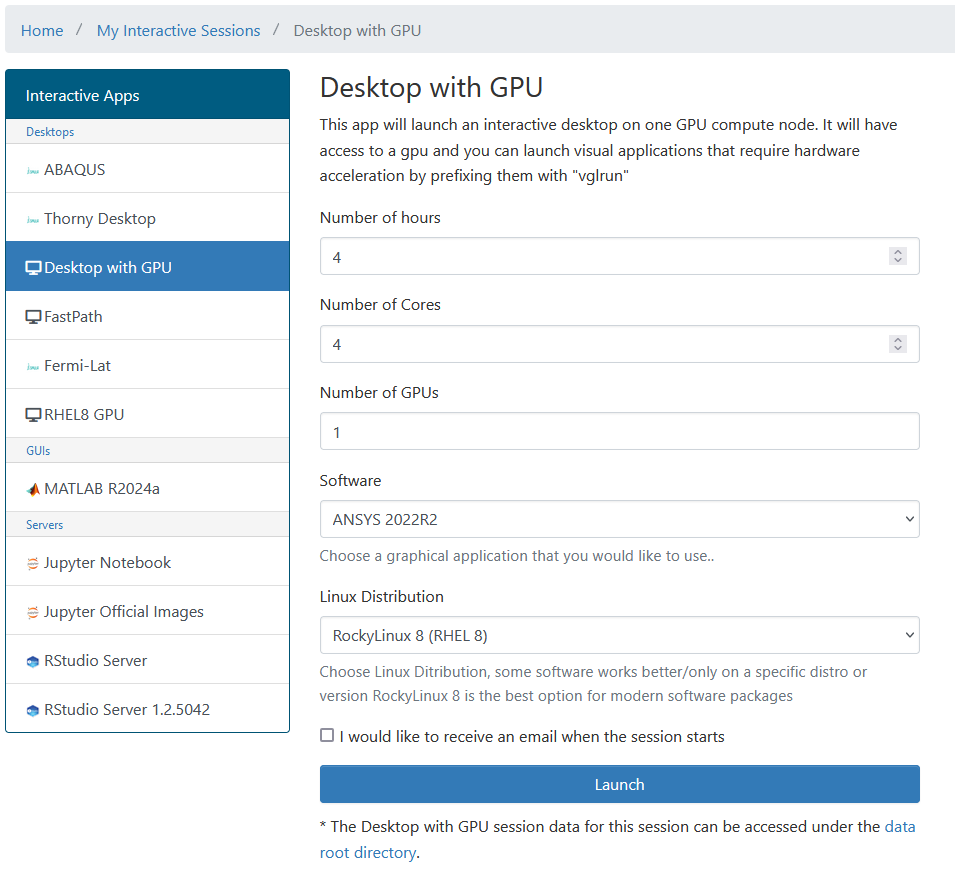

In [2]:
from IPython.display import Image
from IPython.core.display import HTML 
Path = "screenshots/ansys/"

Image(Path + "0_Interactive_Job.png")

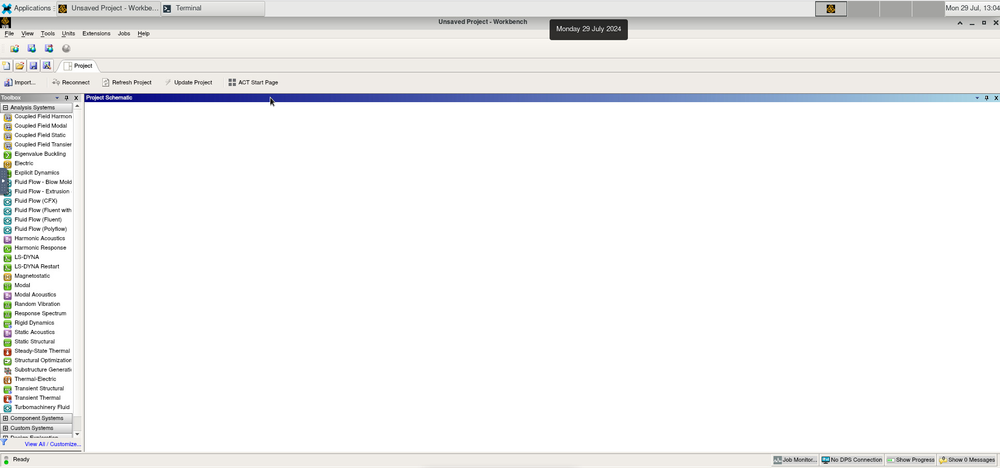

In [3]:
Image(Path + "1_Blank_Project.png")

To create a new project with Fluent, drag it to the workspace.
Start DesignModeler by double-clicking on "Geometry"

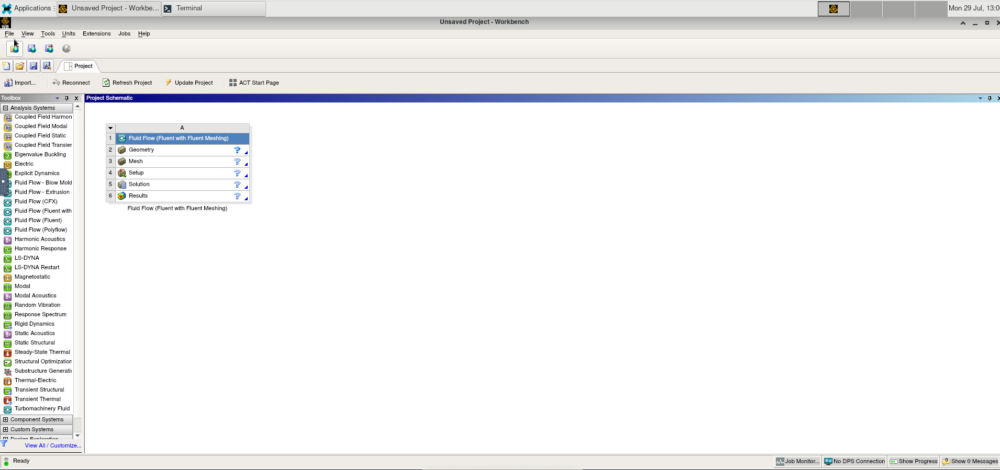

In [4]:
Image(Path + "1a_New_Project.png")

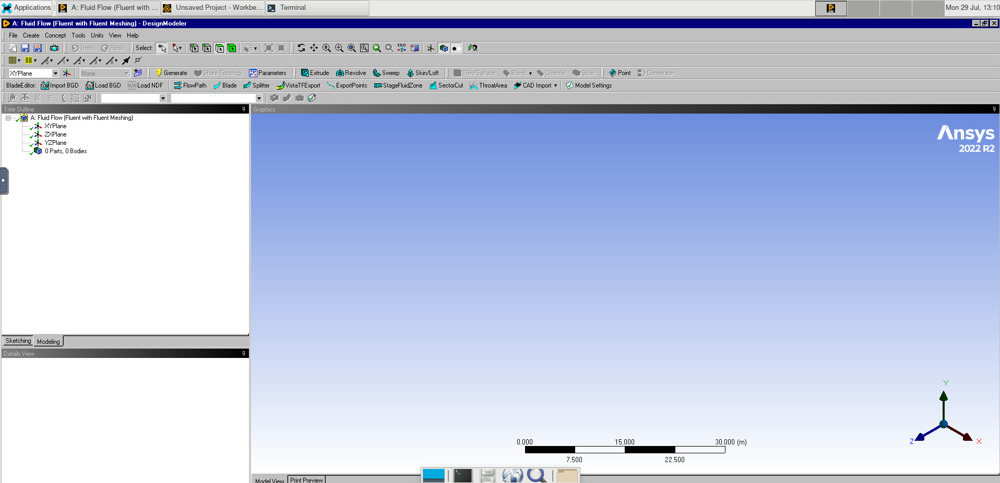

In [5]:
Image(Path + "2_Design_Modeler.png")

Select the XY Plane.

Go to the sketching tab and draw a circle. Under dimensions, add a diameter and set this to 0.2m.

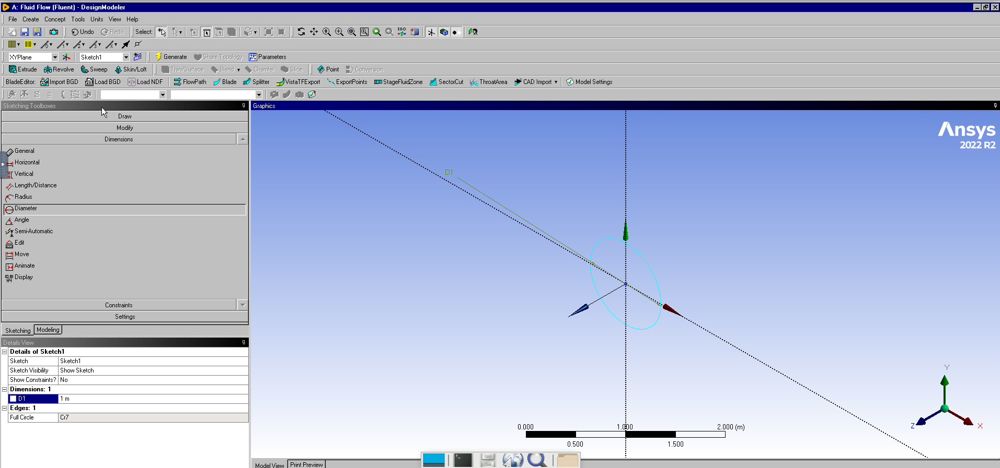

In [6]:
Image(Path + "2b_Circle.png")

Select the Extrude tool. Set the depth to 3.0m.

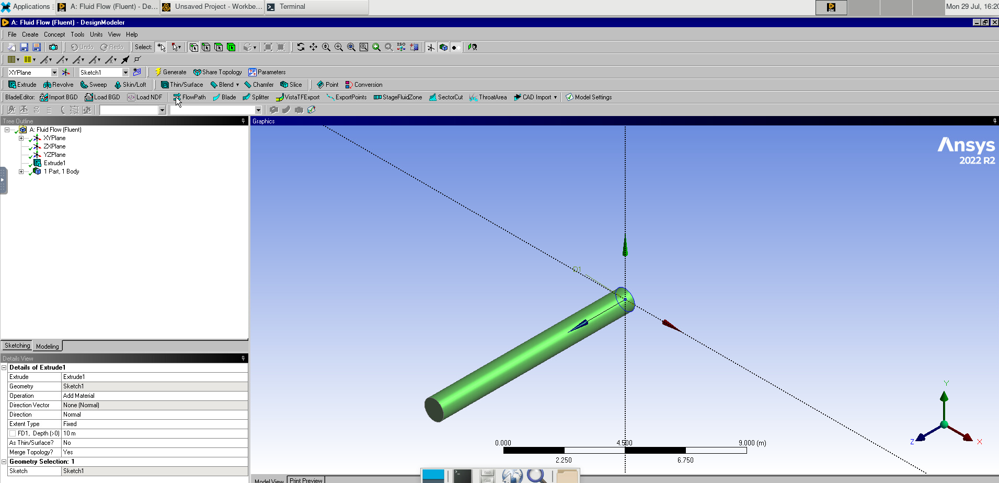

In [7]:
Image(Path + "2b_Extrude_Cylinder.png")

Double-click on "Mesh" to open the meshing software.

Right-clicking on Mesh, add a method. Selecting our pipe, click apply and set the method to Tetrahedrons.

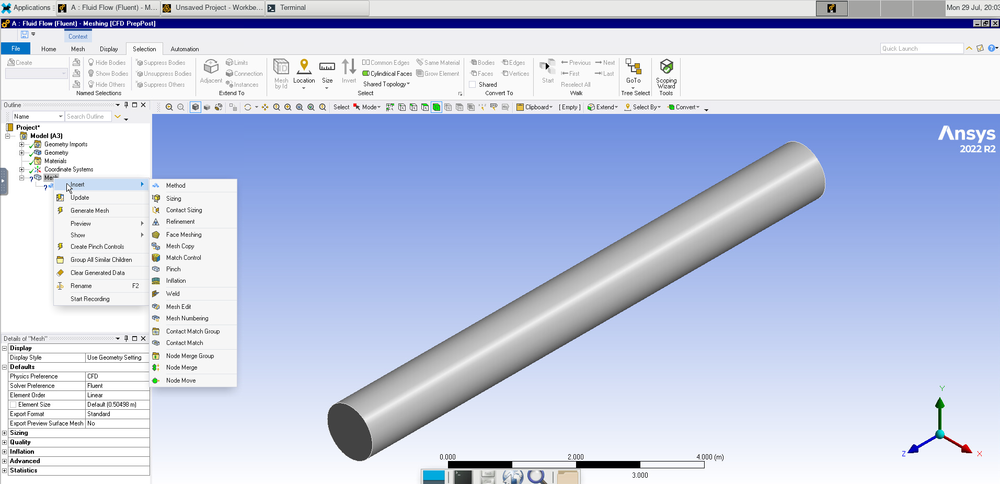

In [8]:
Image(Path + "3_Meshing_Method.png")

Click Generate, the change to the Selection tab and select "Faces".

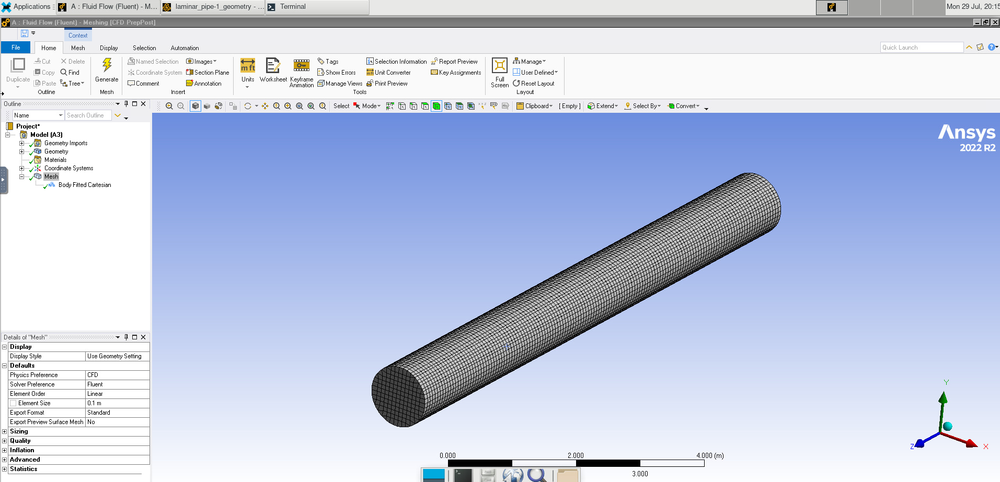

In [9]:
Image(Path + "3b_Meshing_Done.png")

Select the ends of the pipe and name them "Inlet" and "Outlet". Do the same for the "Wall" of the pipe.

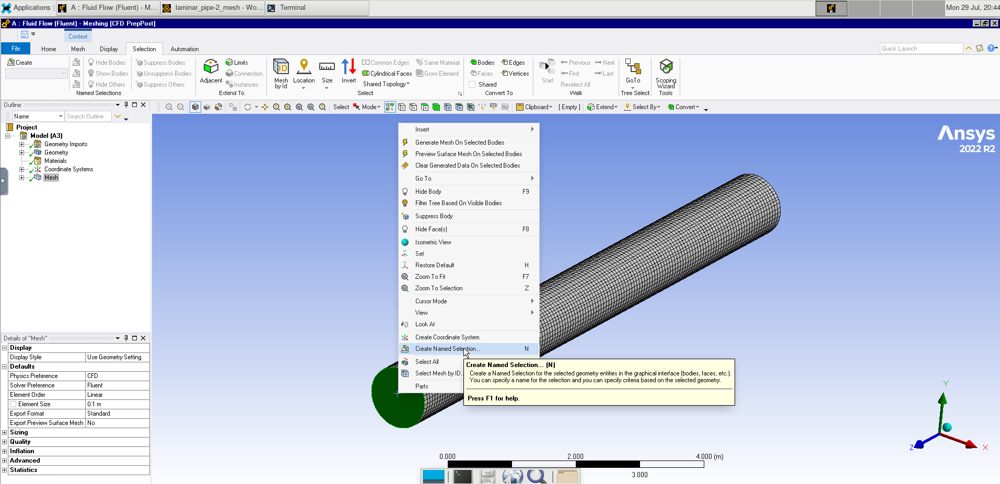

In [10]:
Image(Path + "3c_Name_Selections.png")

After closing out of the meshing program, right-click on meshing and click "update".

Double-click on Setup. Make sure Double Precision is selected and set the number of solver processes to the number of cores we want to use (in our case, 4).

Under model, change the Viscous model to Laminar.

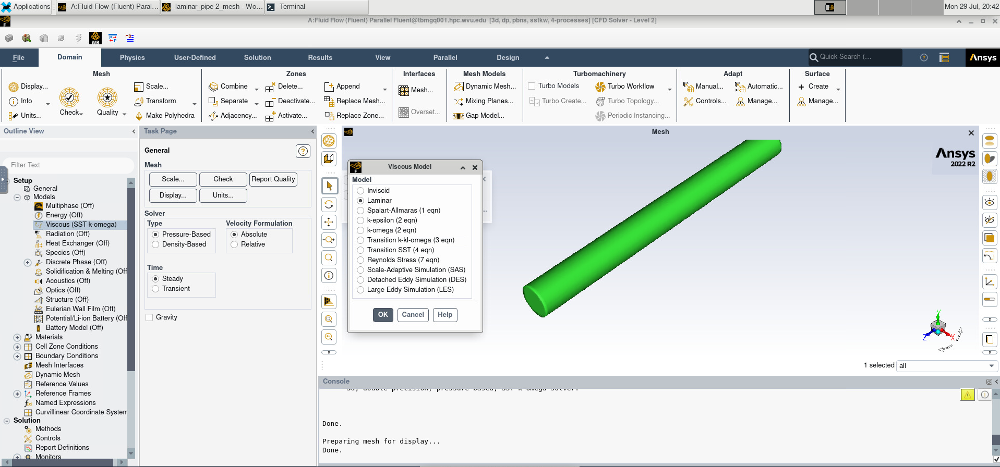

In [11]:
Image(Path + "4_Model.png")

Under Materials > Fluid, select air. Change the density to 1 kg/m$^3$ and the viscosity to 0.002 kg/(ms). Make sure to click change/create before closing the window.

Under Boundary Conditions, change the inlet boundary condition to 1.0 m/s and the outlet boundary condition to 1 atm (101325 Pa).

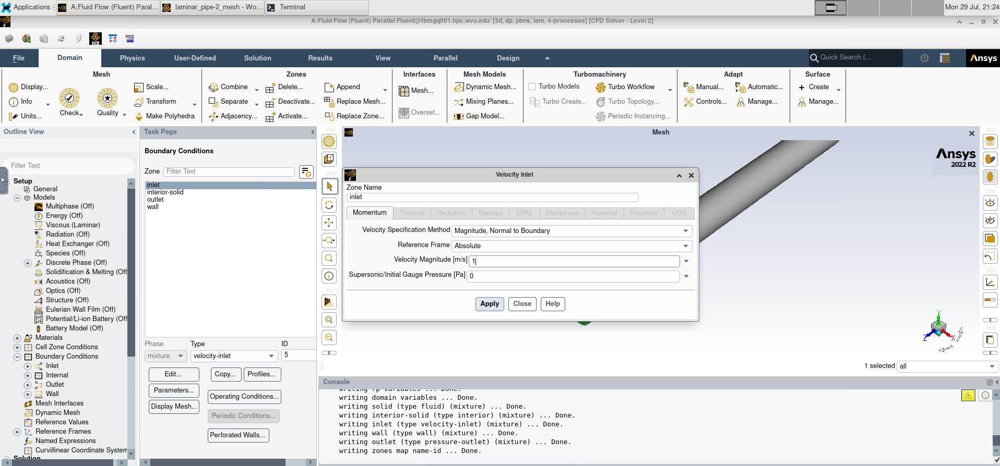

In [12]:
Image(Path + "4a_Boundary_Conditions.png")

Under Initialization, we will use Standard Initialization and compute from the inlet.

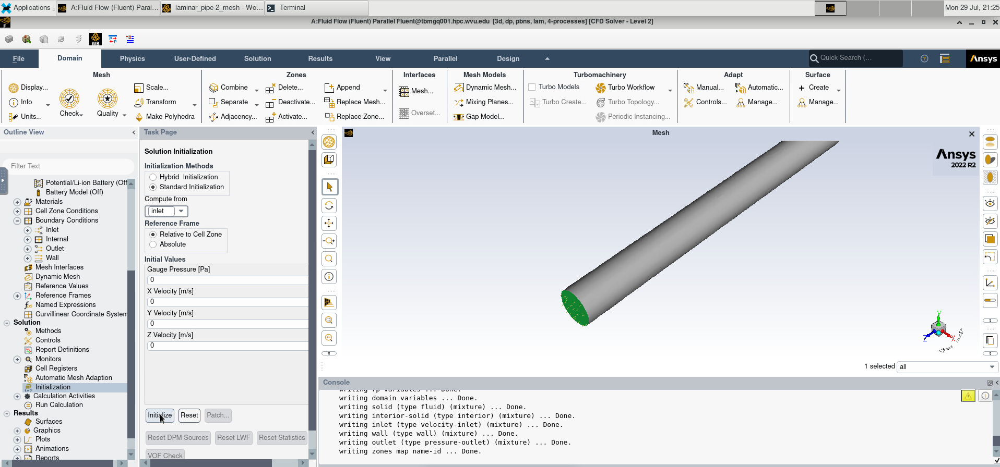

In [13]:
Image(Path + "4b_Initialize.png")

Then, we click "Run Calculation". After setting the Number of Iterations to 200, we click "Calculate"

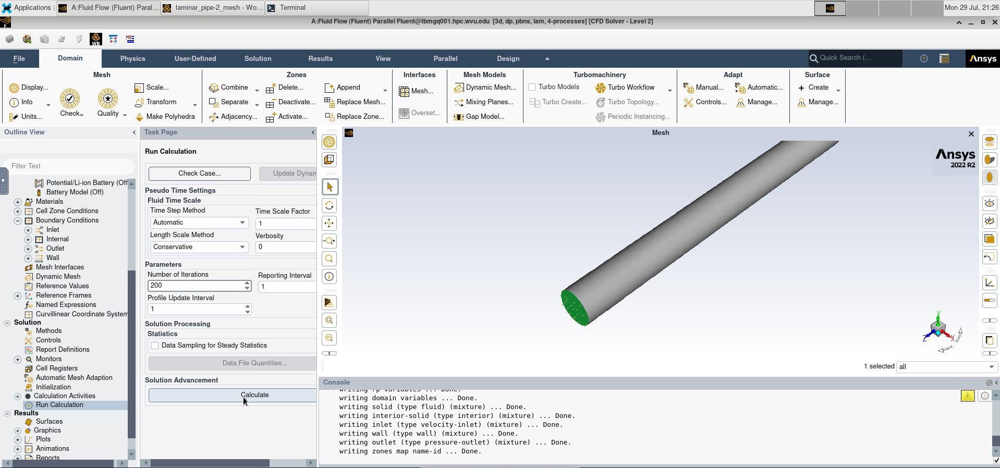

In [14]:
Image(Path + "4c_Calculate.png")

Open the Results window. Click "Location" and select the the XZ-plane.

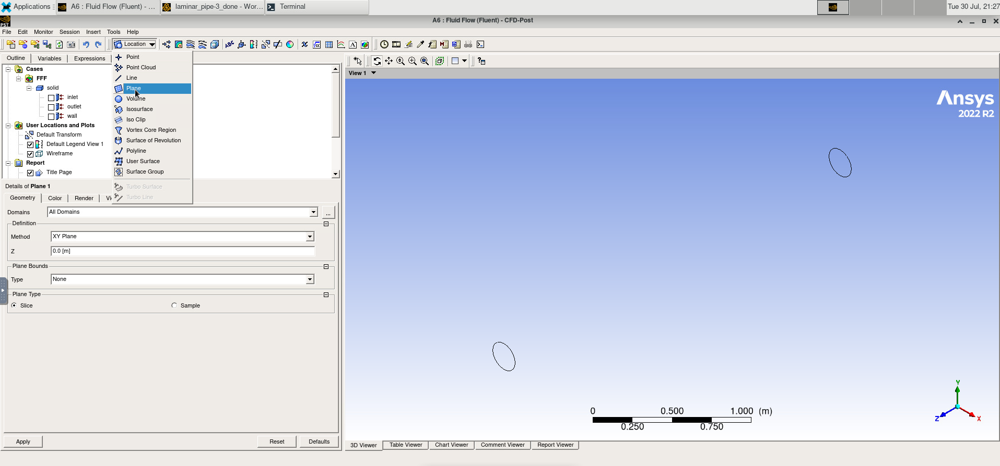

In [15]:
Image(Path + "6_Plane.png")

Then add a contour and select the location we just created and set the variable to velocity.

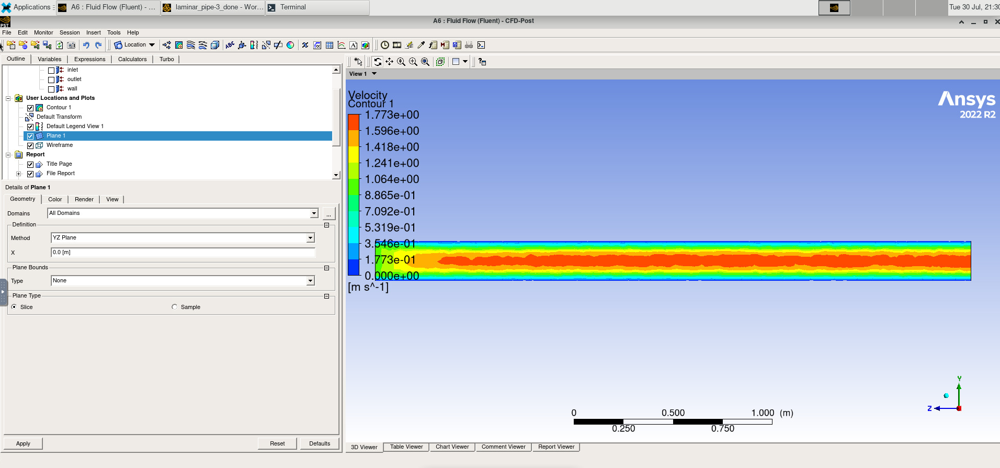

In [16]:
Image(Path + "6a_Contour.png")

### Example: Flow over a Cylinder

#### A note on Grid sizing

It is very important that we select an appropriate size grid for our simulation. We must make sure that we adequately sample the space in order to resolve any interesting features in the physical system we are trying to simulate. This is because that when we try to numerically estimate derivatives on a grid, we essentially are trying to "guess" the actual shape of the underlying function from surrounding points. If we do not sample finely enough, we risk coming up with answers that do not match reality.

We can see this in the example below: when we undersample, there are many different functions that could fit the points, and they do not agree as to what the slope of the curve should be at our sampling points.

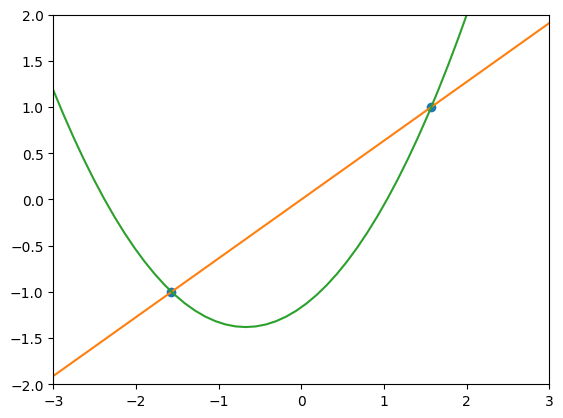

In [17]:
x = np.linspace(-np.pi/2,np.pi/2,2)
y = np.sin(x)

x1 = np.linspace(-3,3,50)
y1 = x1*2/np.pi
y2 = -1.167 + 0.636*x1 + 0.473*x1*x1

plt.figure()
plt.plot(x,y,'o')
plt.plot(x1,y1)
plt.plot(x1,y2)
plt.axis([-3.0, 3.0, -2.0, 2.0])
plt.show()

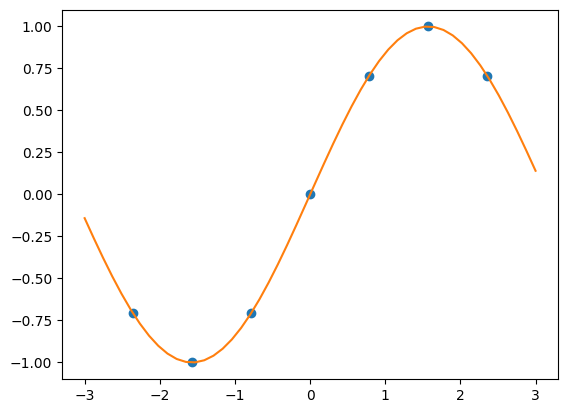

In [18]:
plt.figure()
x = np.linspace(-3*np.pi/4,3*np.pi/4,7)
plt.plot(x,np.sin(x),'o')

plt.plot(x1,np.sin(x1))
plt.show()

However, finer sampling comes at the cost of rapidly increasing how much memory and time your simulation you will require.

After creating a new project, we will open its properties and set the analysis type to 3D.

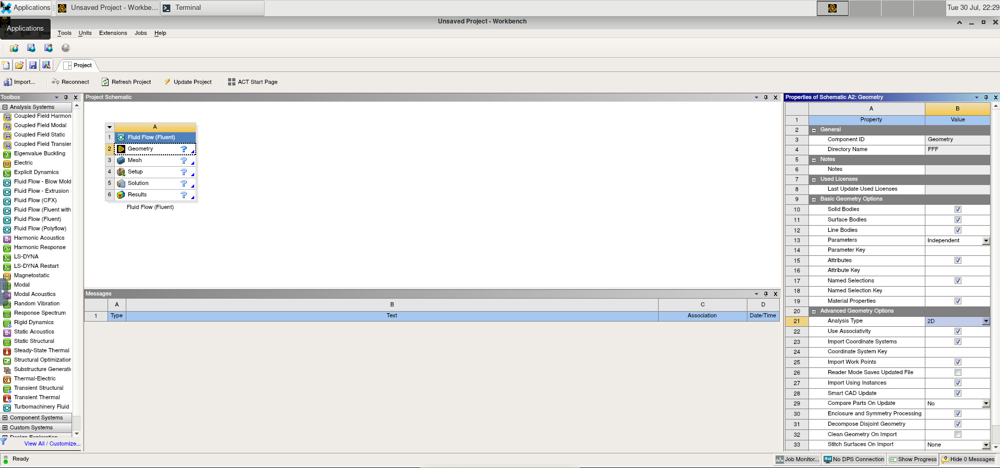

In [19]:
Image(Path + "7_Project_Properties.png")

Then we create a 15-by-32 meter rectangle and a 1 m diameter circle. These represent our computational domain and the cylinder.

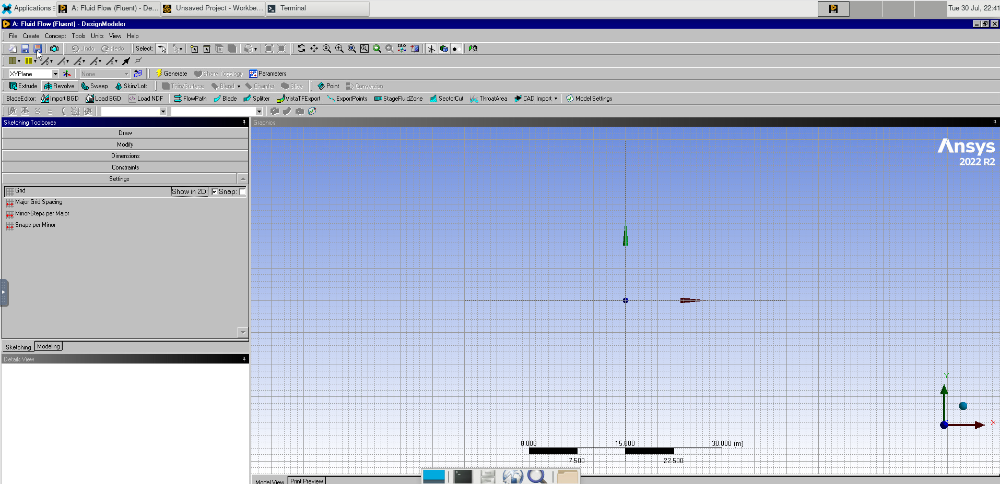

In [20]:
Image(Path + "8_Grid_On.png")

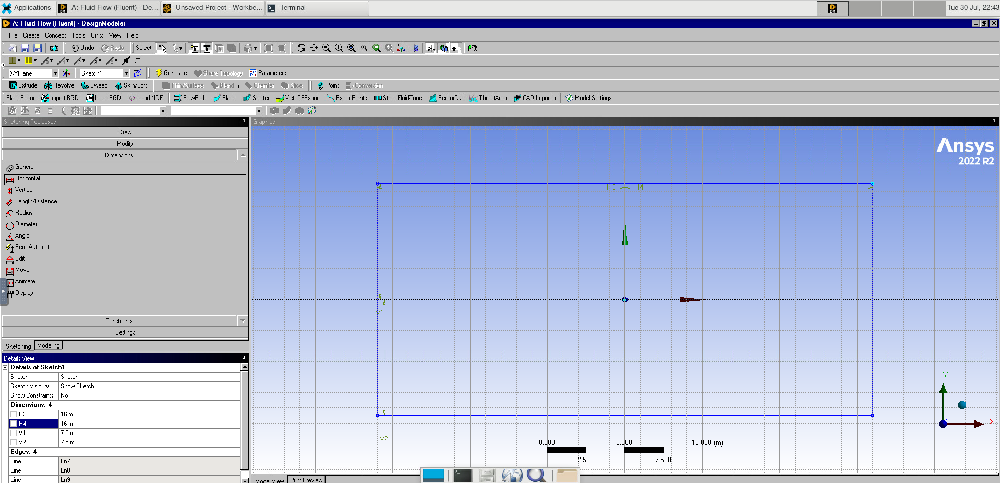

In [21]:
Image(Path + "8a_Rectangle.png")

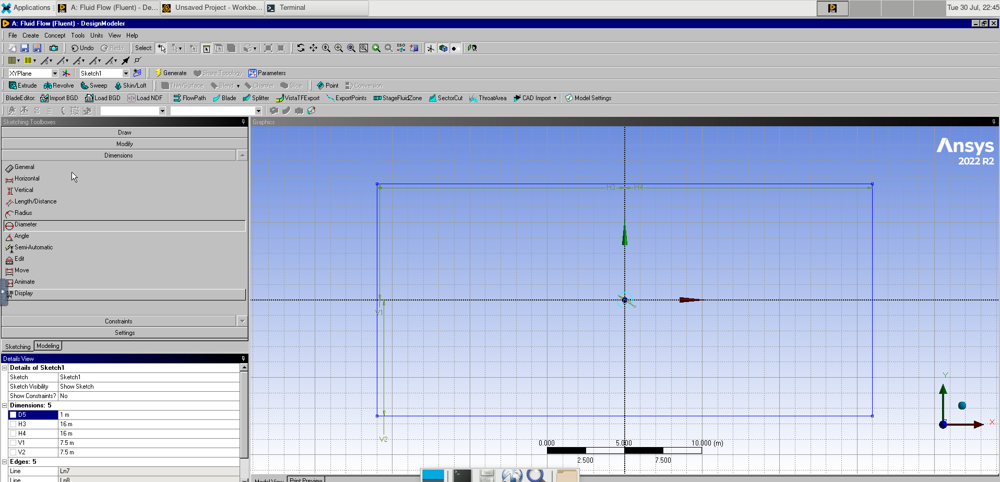

In [22]:
Image(Path + "8b_Rectangle.png")

In the toolbar, select Concept > Surface from Sketches. Select Sketch1 and click apply, then click Generate. Selecting the Created Surface Body, we set it to Fluid.

In Geometry, set the thickness to 0 m because we are working with a 2D problem.

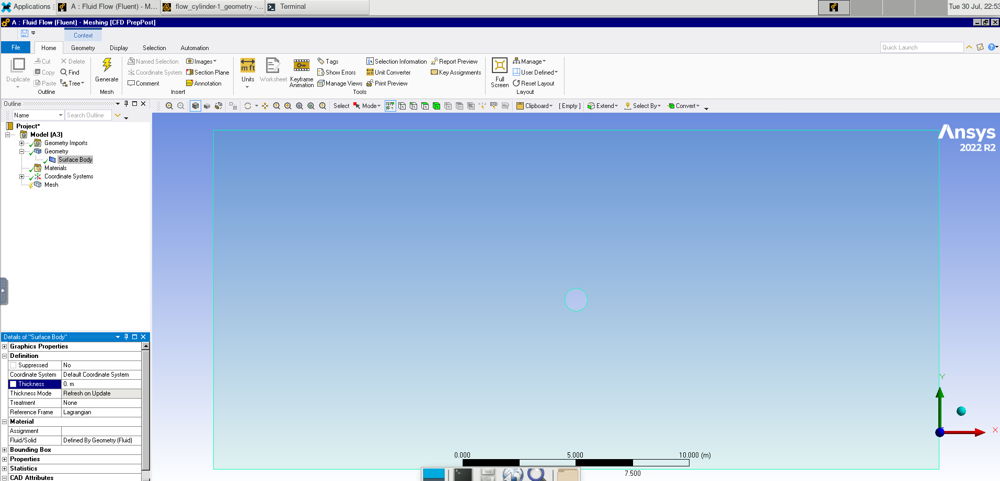

In [23]:
Image(Path + "9_Thickness.png")

We will once again add a method, this time setting it to triangles, and the sizing to 0.3 m.

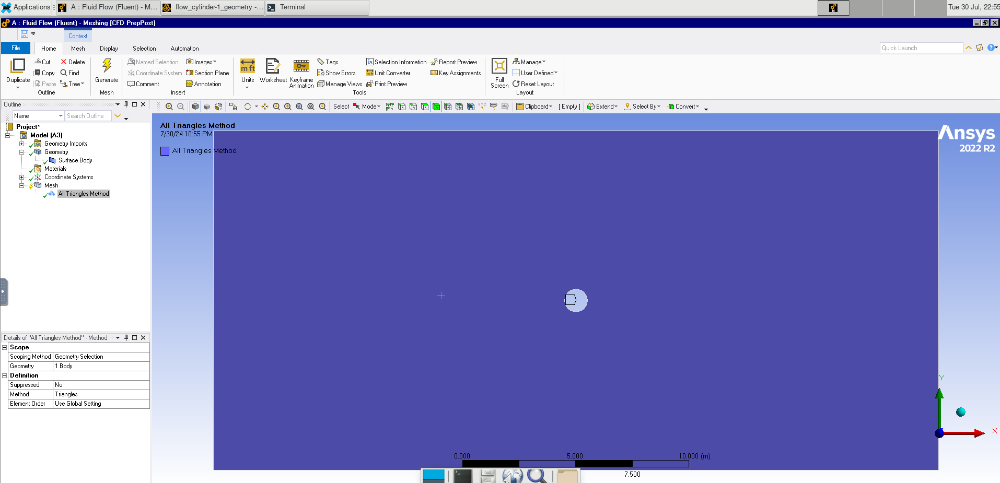

In [24]:
Image(Path + "9b_Method.png")

We will also add Sizing, setting it to the edge of the cylinder and setting the spacing to 0.025 m

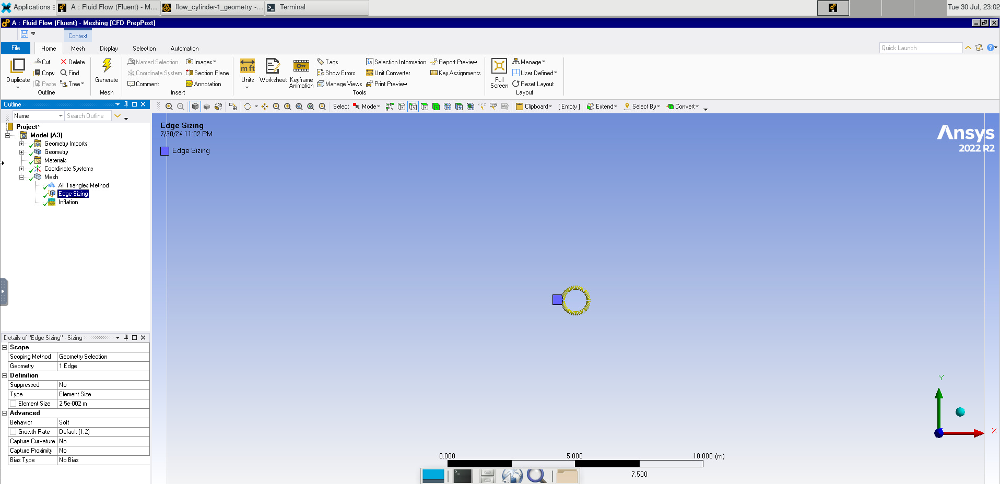

In [25]:
Image(Path + "9c_Edge_Sizing.png")

We will also add Inflation, applying it to the fluid domain. Set the Boundary to the edge of the cylinder. Using the First Layer Thickness method, we set the first layer height to 0.025 m. We will also set the layers to 40 and the growth rate to 2.5

We will once again create named selections, naming the inlet, outlet, walls, and cylinder in our setup.

Change from a Steady to Transient solver. Again, we change the model to laminar flow. We will also set the density and viscosity to 1.

The only thing we will change with the boundary conditions is to set the inlet velocity to 80.

In Reference Values, we will calculate from the inlet.

Under Solution Methods, we set the Transient Formulation to Second Order Implicit.

Next we initialize using hybrid initialization. 

In Calculation Activities, we tell the simulation to save every fifth frame.

Finally, we will run the calculation with a step size of 0.01, 20 iterations per time step, and 50 iterations.

We will create a plot for the surface body at symmetry 1, plotting the velocity.

Using the time step selector, we can also view what the system looked like at earlier times.

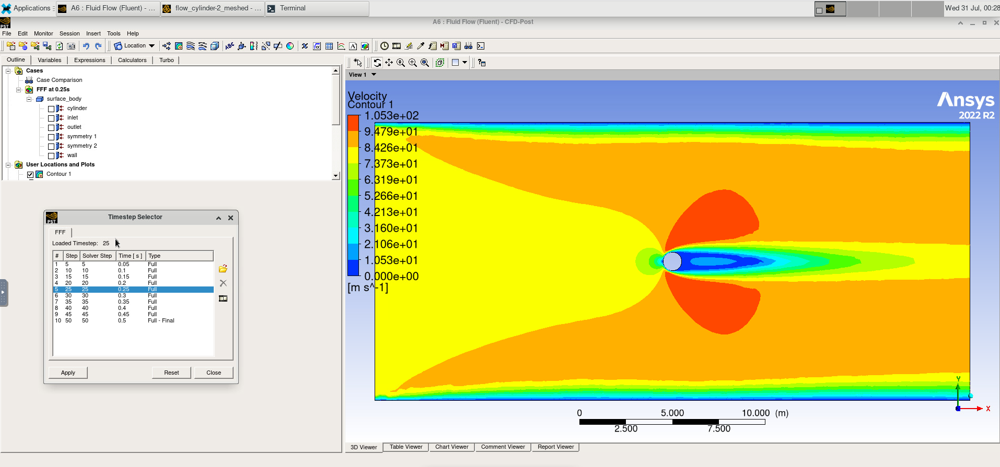

In [26]:
Image(Path + "9d_Contour.png")